### Alter the following parameters to provide different graphs below

In [193]:
tests_dir = "../tests/"
# test_dir = tests_dir + "test_1_8_11_2021/" # change this to the folder you want displayed
# test_dir = tests_dir + "test_21_12_2021/"
# test_dir = tests_dir + "test_18_1_2022/"
# test_dir = tests_dir + "test_17_3_2022/"
test_dir = tests_dir + "test_1_5_2022/"

In [194]:
import json

def get_meta(test_dir):
    with open(test_dir + 'meta.json', 'r') as f:
        return json.load(f)

meta = get_meta(test_dir)

start_time = meta["start_time"]
end_time = meta["end_time"] #TODO: using a time greater than 10 breaks comparison
using_mesh = meta["using_mesh"]
frequency = meta["frequency"]

In [195]:
from os import listdir
from os.path import isfile, join

# get all servant drifter files
def get_file_name_list(test_dir):
    return [test_dir + f for f in listdir(test_dir) if isfile(join(test_dir, f)) and 'svt' in f]

file_name_list = get_file_name_list(test_dir)
print(file_name_list)

# get names of drifters from file names
def get_drifter_names(file_name_list):
    idxOfName = file_name_list[0].index('D')
    return [n[idxOfName : idxOfName + 3] for n in file_name_list]

drifter_names = get_drifter_names(file_name_list)

['../tests/test_17_3_2022/svtD01.csv', '../tests/test_17_3_2022/svtD02.csv', '../tests/test_17_3_2022/svtD04.csv', '../tests/test_17_3_2022/svtD05.csv', '../tests/test_17_3_2022/svtD06.csv', '../tests/test_17_3_2022/svtD07.csv', '../tests/test_17_3_2022/svtD08.csv', '../tests/test_17_3_2022/svtD10.csv']


### Importing Data

In [196]:
import os, csv
import matplotlib.pyplot as plt
import pandas as pd

In [197]:
def read_from_CSV(file_name, frequency, start_time, end_time):
  data = []
  with open(file_name, 'r', newline='') as csvfile:
      csv_reader = csv.reader(csvfile, quoting=csv.QUOTE_ALL)
      for idx, row in enumerate(csv_reader):
          if len(row) == 0:
              continue
          else:
              if '#FILE ERASED AT' not in row:
                  if idx != 0:
                      if idx % frequency == 0:
                          if row[1] > start_time and row[1] < end_time:
                              if len(row) == 20:
                                  row.pop()
                              data.append(row)
      csvfile.close()
      return data

In [198]:
def make_drifter_list(file_name_list, frequency, start_time, end_time, using_mesh=False):
  drifter_list = [None] * len(file_name_list)
  for idx, file_name in enumerate(file_name_list):
    data = read_from_CSV(file_name, frequency, start_time, end_time)
    if not using_mesh:
      drifter_list[idx] = pd.DataFrame(data, columns=['Date', 'Time', 'Longitude', 'Latitude', 'GPS Age'])
    # else:
      # drifter_list[idx] = pd.DataFrame(data, columns=['Date', 'Time', 'Longitude', 'Latitude', 'GPS Age', 'Sent',
      # 'Received', 'Master','D01', 'D02','D03','D04','D05','D06','D07'])
    else:
      drifter_list[idx] = pd.DataFrame(data, columns=['Date', 'Time', 'Longitude', 'Latitude', 'GPS Age', 'Battery',
      'Sent', 'Received', 'Master', 'D01', 'D02','D03','D04','D05','D06','D07', 'D08', 'D09', 'D10'])
  for df in drifter_list:
    print(df.head())
  return drifter_list

drifter_list = make_drifter_list(file_name_list, frequency, start_time, end_time, using_mesh)

        Date    Time   Longitude    Latitude GPS Age Battery Sent Received  \
0  2022-3-17   4:1:6  115.704915  -32.136744      11   98.00   39        0   
1  2022-3-17  4:1:16  115.704920  -32.137441      78   98.00   39        0   
2  2022-3-17  4:1:26  115.705036  -32.138135      14   98.03   39        0   
3  2022-3-17  4:1:36  115.705266  -32.138807     166   98.00   39        0   
4  2022-3-17  4:1:46  115.705446  -32.139516     104   98.00   39        0   

  Master D01 D02 D03 D04 D05 D06 D07 D08 D09 D10  
0      0   0   0   0   0   0   0   0   0   0   0  
1      0   0   0   0   0   0   0   0   0   0   0  
2      0   0   0   0   0   0   0   0   0   0   0  
3      0   0   0   0   0   0   0   0   0   0   0  
4      0   0   0   0   0   0   0   0   0   0   0  
        Date    Time   Longitude    Latitude GPS Age Battery Sent Received  \
0  2022-3-17   4:5:2  115.708197  -32.152962     365   97.64   18        0   
1  2022-3-17  4:5:12  115.708257  -32.153602      36   97.59   24    

### Calculating local velocities

In [199]:
import math
from datetime import datetime

# Same as TinyGPS library calculation
def get_distance(lat1, lon1, lat2, lon2):
    delta = math.radians(lon1 - lon2)
    sdlong = math.sin(delta)
    cdlong = math.cos(delta)
    lat1 = math.radians(lat1)
    lat2 = math.radians(lat2)
    slat1 = math.sin(lat1)
    clat1 = math.cos(lat1)
    slat2 = math.sin(lat2)
    clat2 = math.cos(lat2)
    delta = (clat1 * slat2) - (slat1 * clat2 * cdlong)
    delta = delta ** 2
    delta += (clat2 * sdlong) ** 2
    delta = math.sqrt(delta)
    denom = (slat1 * slat2) + (clat1 * clat2 * cdlong)
    delta = math.atan2(delta, denom)
    return delta * 6372795

In [200]:
def split_time_from_df(drifter, using_mesh=False):
  drifter_stamps = []
  for ii in range(len(drifter) - 1):
    # print(drifter_stamps)
    date_stamp = drifter.Date[ii]
    if not using_mesh:
      new_date_stamp = date_stamp.split('/')
    else:
      new_date_stamp = date_stamp.split('-')
    timestamp = drifter.Time[ii]
    new_timestamp = timestamp.split(':')
    drifter_stamps.append([*new_date_stamp, *new_timestamp])
  return drifter_stamps

In [201]:
# def calc_overall_local_currents(drifter_list, drifter_names):
#   drifter_stamps = split_time_from_df(drifter_list[0], using_mesh)
#   start_time_stamps = list(map(int, drifter_stamps[0]))
#   end_time_stamps = list(map(int, drifter_stamps[-1]))
#   start_time = datetime(start_time_stamps[2], start_time_stamps[1], start_time_stamps[0], start_time_stamps[3], start_time_stamps[4], start_time_stamps[5])
#   end_time = datetime(end_time_stamps[2], end_time_stamps[1], end_time_stamps[0], end_time_stamps[3], end_time_stamps[4], end_time_stamps[5])
#   time_delta_s = (end_time - start_time).total_seconds()
#   print('Total drift time')
#   print(time_delta_s, 's\n')
#   for idx, drifter in enumerate(drifter_list):
#     lat_1 = float(drifter.Latitude[0])
#     lon_1 = float(drifter.Longitude[0])
#     lat_2 = float(drifter.Latitude[len(drifter) - 1])
#     lon_2 = float(drifter.Longitude[len(drifter) - 1])
  
#     print(drifter_names[idx])
#     dist = get_distance(lat_1, lon_1, lat_2, lon_2)
#     print("Total distance: ", dist, 'm')
#     velocity = dist/time_delta_s
#     print("Velocity: ", velocity, 'm/s')

# calc_overall_local_currents(drifter_list, drifter_names)

In [202]:
def get_time_delta_start_to_end(drifter_stamps):
    stamp = drifter_stamps[1]
    stamp = list(map(int, stamp))
    stamp_2 = drifter_stamps[len(drifter_stamps) - 1]
    stamp_2 = list(map(int, stamp_2))
    if not using_mesh:
        start_time = datetime(stamp[2], stamp[1], stamp[0], stamp[3], stamp[4], stamp[5])
        end_time = datetime(stamp_2[2], stamp_2[1], stamp_2[0], stamp_2[3], stamp_2[4], stamp_2[5])
    else:
        start_time = datetime(stamp[0], stamp[1], stamp[2], stamp[3], stamp[4], stamp[5])
        end_time = datetime(stamp_2[0], stamp_2[1], stamp_2[2], stamp_2[3], stamp_2[4], stamp_2[5])
    return (end_time - start_time).total_seconds()
# 7:22:18
def get_time_delta(drifter_stamps, ii):
    stamp = drifter_stamps[ii]
    stamp = list(map(int, stamp))
    stamp_2 = drifter_stamps[ii + 1]
    stamp_2 = list(map(int, stamp_2))
    if not using_mesh:
        start_time = datetime(stamp[2], stamp[1], stamp[0], stamp[3], stamp[4], stamp[5])
        end_time = datetime(stamp_2[2], stamp_2[1], stamp_2[0], stamp_2[3], stamp_2[4], stamp_2[5])
    else:
        start_time = datetime(stamp[0], stamp[1], stamp[2], stamp[3], stamp[4], stamp[5])
        end_time = datetime(stamp_2[0], stamp_2[1], stamp_2[2], stamp_2[3], stamp_2[4], stamp_2[5])
    return (end_time - start_time).total_seconds()

In [348]:
def calc_individual_local_currents(drifter_list, drifter_names, using_mesh=False):
    for idx, drifter in enumerate(drifter_list):
        velocity_list = []
        drifter_stamps = split_time_from_df(drifter, using_mesh)
        # if idx == 0 or idx == 1 or idx == 5:
        #     velocity_list.append(0)
        # else:
        try:
            for ii in range(len(drifter_stamps) - 1):
                time_delta_s = get_time_delta(drifter_stamps, ii)
                lat_1 = float(drifter.Latitude[ii])
                lon_1 = float(drifter.Longitude[ii])
                lat_2 = float(drifter.Latitude[ii + 1])
                lon_2 = float(drifter.Longitude[ii + 1])
                dist = get_distance(lat_1, lon_1, lat_2, lon_2)
                # print('Distance:', dist, 'm')
                velocity = dist / time_delta_s
                velocity_list.append(velocity)
        except:
            continue
        yield velocity_list

D02 0.009410909415916154 0.489752224447818
D04 0.0 0.29019254158380725
D05 0.0 0.31082958944805755
D06 0.009412734949360634 0.37709591755468336
D08 0.015682681355907287 0.42401951144457295


C:\Users\Roark\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Roark\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


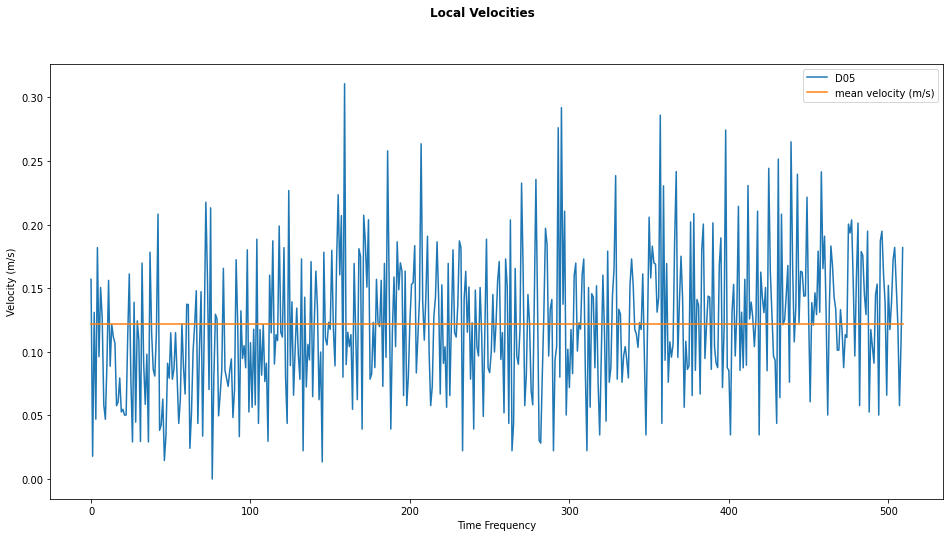

In [358]:
currents_velocities = calc_individual_local_currents(drifter_list, drifter_names, using_mesh)

%matplotlib inline
from numpy import mean, amin, amax
import numpy as np

import matplotlib.pyplot as plt
# from matplotlib.pyplot import figure

def plot_local_velocities(currents_velocities, drifter_names):
    fig = plt.figure(figsize=(16,8))
    
    fig.suptitle("""Local Velocities\n\n""", fontweight ="bold")
    idx = 0
    for curr in currents_velocities:
        if idx == 0:
            idx += 1
        elif idx == 5:
            idx += 1
        tmp_curr = np.array(curr[230:740])
        avg_curr = mean(tmp_curr)
        try:
            print(drifter_names[idx], amin(tmp_curr), amax(tmp_curr))
        except:
            continue
        # print(avg_curr)
        avg_curr_list = [avg_curr for _ in range(510)]
        if(avg_curr > 0):
            if idx == 3:
                plt.plot(tmp_curr, label=drifter_names[idx])
                # plt.plot(np.unique(tmp_curr), np.poly1d(np.polyfit(tmp_curr, [1 for _ in range(510)], 1))(np.unique(tmp_curr)), label=drifter_names[idx])
                plt.plot(avg_curr_list, label='mean velocity (m/s)')
                plt.ylabel('Velocity (m/s)')
                plt.xlabel('Time Frequency')
                plt.legend()
        idx += 1

plot_local_velocities(currents_velocities, drifter_names)

In [265]:
avg_velocity = mean(numpy.array([0.18321181034716078, 0.1334058034581834, 0.12159840930338621, 0.1356022795901636, 0.1790141623471552]))
avg_velocity

0.15056649300920982

In [80]:
def get_times_from_start(drifter):
    drifter_stamps = split_time_from_df(drifter, using_mesh)
    return get_time_delta_start_to_end(drifter_stamps)

def fix_battery_percent(drifter):
    magic_conversion: float = 2.380952381
    # drifter['Battery'] = drifter['Battery'].apply(lambda x: str(float(x * 100.0) / magic_conversion))
    drifter.Battery = drifter.Battery.astype(float)
    drifter.Battery = (drifter.Battery * 100.0) / magic_conversion
    drifter.Battery = (drifter.Battery - 3200.0) / 10.0

    return drifter

def get_battery_consumption(drifter_list, time_since_start_s):
    for idx, drifter in enumerate(drifter_list):
        # drifter = fix_battery_percent(drifter) # only do this once? - should really post-process data
        batt_start = (float)(drifter.Battery[0])
        batt_last = (float)(drifter.Battery[len(drifter.Battery) - 1])
        yield (batt_start - batt_last) / time_since_start_s

# consumption starts at %/sec
def output_battery_consumption(consumption):
    # print(f"{consumption:.4f}% per second")
    # print(f"{consumption * 60:.4f}% per minute")
    print(f"{consumption * 60 * 60:.4f}% per hour\n")

time_since_start_s = get_times_from_start(drifter_list[1])
battery_consumptions = get_battery_consumption(drifter_list, time_since_start_s)

for idx, consumption in enumerate(battery_consumptions):
    print(drifter_names[idx])
    output_battery_consumption(consumption)

D01
0.1279% per hour

D02
0.5039% per hour

D04
0.4889% per hour

D05
0.3836% per hour

D06
1.4854% per hour

D07
0.6017% per hour

D08
0.5791% per hour

D10
0.3949% per hour



### Plotting GPS locations

In [119]:
import folium

swan_coordinates = [-31.9976045, 115.8226236] # good coordinates for swan river test 1
farm_coordinates = [-33.9316144, 115.1822156] # remove these later
glendalough_coords = [-31.919785, 115.8111968] # remove these later
cockburn_sound_coords = [-32.097313, 115.709433] # remove these later

coords = cockburn_sound_coords

swan_map = folium.Map(location=coords, zoom_start=13)

# using frequency defined at top of notebook
# Many points causes map to lag a great deal
def add_markers_to_map(map, drifter_list, drifter_names, with_radius=False):
    colour_list = ['blue', 'orange', 'gray', 'green', 'lightblue', 'lightgray', 'lightred', 'darkred', 'darkgreen',
        'purple', 'lightgreen', 'red', 'pink', 'beige', 'black', 'darkpurple', 'darkblue', 'white', 'cadetblue']
    for idx, drifter in enumerate(drifter_list):
        for ii in range(len(drifter.Longitude)):
            folium.Marker(
                location=[drifter.Latitude[ii], drifter.Longitude[ii]],
                popup=f"<stong>Pos: {ii} </stong>",
                icon=folium.Icon(icon="none", color=colour_list[idx]),
                tooltip=drifter_names[idx]).add_to(map)
            if with_radius:
                folium.Circle([drifter.Latitude[ii], drifter.Longitude[ii]],
                    color=colour_list[idx],
                    radius=2000).add_to(map)
        map.add_child(folium.LatLngPopup())
    return map

swan_map_w_markers = add_markers_to_map(swan_map, drifter_list, drifter_names, False)
swan_map_w_markers

In [120]:
import folium
import pandas as pd

d_list = [None] * 2
d_list[0] = pd.DataFrame({'Longitude': [115.714748], 'Latitude': [-32.181189]}, index=[0])
d_list[1] = pd.DataFrame({'Longitude': [115.708808], 'Latitude': [-32.240662]}, index=[0])

swan_map = folium.Map(location=[-32.207313, 115.709433], zoom_start=14)

def add_markers_to_map(map, d_list):
    colour_list = ['blue', 'orange', 'gray', 'green', 'lightblue', 'lightgray', 'lightred', 'darkred', 'darkgreen',
        'purple', 'lightgreen', 'red', 'pink', 'beige', 'black', 'darkpurple', 'darkblue', 'white', 'cadetblue']
    for idx, drifter in enumerate(d_list):
        for ii in range(len(drifter.Longitude)):
            folium.Marker(
                location=[drifter.Latitude[ii], drifter.Longitude[ii]],
                icon=folium.Icon(icon="none", color=colour_list[idx])).add_to(map)
        map.add_child(folium.LatLngPopup())
    return map

swan_map_w_markers = add_markers_to_map(swan_map, d_list)
swan_map_w_markers

In [121]:
d_list = [None] * 9
d_list[1] = pd.DataFrame({'Longitude': [115.719423418], 'Latitude': [-32.220715722]}, index=[0])
d_list[2] = pd.DataFrame({'Longitude': [115.728741320], 'Latitude': [-32.212339703]}, index=[0])
d_list[0] = pd.DataFrame({'Longitude': [115.715482188], 'Latitude': [-32.208726280]}, index=[0])
d_list[3] = pd.DataFrame({'Longitude': [115.716482188], 'Latitude': [-32.208726280]}, index=[0])
d_list[4] = pd.DataFrame({'Longitude': [115.726217721], 'Latitude': [-32.200184891]}, index=[0])
d_list[5] = pd.DataFrame({'Longitude': [115.714376221], 'Latitude': [-32.197885150]}, index=[0])
d_list[6] = pd.DataFrame({'Longitude': [115.720005787], 'Latitude': [-32.189342743]}, index=[0])
d_list[7] = pd.DataFrame({'Longitude': [115.708742996], 'Latitude': [-32.189053205]}, index=[0])
d_list[8] = pd.DataFrame({'Longitude': [115.713987975], 'Latitude': [-32.180635235]}, index=[0])

# d_list[9] = pd.DataFrame({'Longitude': [115.733655], 'Latitude': [-32.221015]}, index=[0])
# d_list[10] = pd.DataFrame({'Longitude': [115.728741320], 'Latitude': [-32.212339703]}, index=[0])
# d_list[11] = pd.DataFrame({'Longitude': [115.730922], 'Latitude': [-32.207917]}, index=[0])
# d_list[12] = pd.DataFrame({'Longitude': [115.730936], 'Latitude': [-32.207939]}, index=[0])
# d_list[13] = pd.DataFrame({'Longitude': [115.731665], 'Latitude': [-32.207306]}, index=[0])
# d_list[14] = pd.DataFrame({'Longitude': [115.720301], 'Latitude': [-32.190253]}, index=[0])
# d_list[15] = pd.DataFrame({'Longitude': [115.734398], 'Latitude': [-32.194787]}, index=[0])
# d_list[16] = pd.DataFrame({'Longitude': [115.727061], 'Latitude': [-32.197115]}, index=[0])
# d_list[17] = pd.DataFrame({'Longitude': [115.729028], 'Latitude': [-32.190711]}, index=[0])

# [8] drifter 4 =  115.729028,-32.190711 #  2:53:08 p.m.
# [7] drifter 5 =  115.727061,-32.197115 #  2:55:55 p.m.
# [6] drifter 6 =  115.734398,-32.194787 #  3:00:02 p.m.
# [5] drifter 1 =  115.720301,-32.190253 # 12:22:25 p.m. battery disconnected?
# [4] drifter 10 = 115.731665,-32.207306 #  3:07:11 p.m.
# [3] drifter 2 =  115.730936,-32.207939 #  3:08:29 p.m
# [0] drifter 7 =  115.730922,-32.207917 #  3:08:49 p.m.
# [2] drifter 9 = no saving
# [1] drifter 8 =  115.733655,-32.221015, # 3:08:35 p.m

# d_list[0] = pd.DataFrame({'Longitude': [115.729517812], 'Latitude': [-32.223343334]}, index=[0])

swan_map = folium.Map(location=[-32.207313, 115.709433], zoom_start=14)

def add_markers_to_map(map, d_list):
    colour_list = ['blue', 'orange', 'gray', 'green', 'lightblue', 'lightgray', 'lightred', 'darkred', 'darkgreen',
    'blue', 'orange', 'gray', 'green', 'lightblue', 'lightgray', 'lightred', 'darkred', 'darkgreen']
    for idx, drifter in enumerate(d_list):
        for ii in range(len(drifter.Longitude)):
            folium.Marker(
                location=[drifter.Latitude[ii], drifter.Longitude[ii]],
                icon=folium.Icon(icon="none", color=colour_list[idx])).add_to(map)
        map.add_child(folium.LatLngPopup())
    return map

swan_map_w_markers = add_markers_to_map(swan_map, d_list)
swan_map_w_markers

In [122]:
d_list = [None] * 18
d_list[1] = pd.DataFrame({'Longitude': [115.719423418], 'Latitude': [-32.220715722]}, index=[0])
d_list[2] = pd.DataFrame({'Longitude': [115.728741320], 'Latitude': [-32.212339703]}, index=[0]) # no save
d_list[0] = pd.DataFrame({'Longitude': [115.715482188], 'Latitude': [-32.208726280]}, index=[0])
d_list[3] = pd.DataFrame({'Longitude': [115.716482188], 'Latitude': [-32.208726280]}, index=[0])
d_list[4] = pd.DataFrame({'Longitude': [115.726217721], 'Latitude': [-32.200184891]}, index=[0])
d_list[5] = pd.DataFrame({'Longitude': [115.714376221], 'Latitude': [-32.197885150]}, index=[0])
d_list[6] = pd.DataFrame({'Longitude': [115.720005787], 'Latitude': [-32.189342743]}, index=[0])
d_list[7] = pd.DataFrame({'Longitude': [115.708742996], 'Latitude': [-32.189053205]}, index=[0])
d_list[8] = pd.DataFrame({'Longitude': [115.713987975], 'Latitude': [-32.180635235]}, index=[0])

d_list[10] = pd.DataFrame({'Longitude': [115.733655], 'Latitude': [-32.221015]}, index=[0])
d_list[11] = pd.DataFrame({'Longitude': [115.728741320], 'Latitude': [-32.212339703]}, index=[0]) # no save
d_list[9] = pd.DataFrame({'Longitude': [115.730981], 'Latitude': [-32.207644]}, index=[0])
d_list[12] = pd.DataFrame({'Longitude': [115.730791], 'Latitude': [-32.207999]}, index=[0])
# d_list[13] = pd.DataFrame({'Longitude': [115.731665], 'Latitude': [-32.207306]}, index=[0])
d_list[13] = pd.DataFrame({'Longitude': [115.738635], 'Latitude': [-32.200680]}, index=[0])
d_list[14] = pd.DataFrame({'Longitude': [115.705783], 'Latitude': [-32.119827]}, index=[0])
d_list[15] = pd.DataFrame({'Longitude': [115.729029], 'Latitude': [-32.190720]}, index=[0])
d_list[16] = pd.DataFrame({'Longitude': [115.722345], 'Latitude': [-32.189196]}, index=[0])
d_list[17] = pd.DataFrame({'Longitude': [115.721718], 'Latitude': [-32.181195]}, index=[0])

# 6:53:9,115.729029,-32.190720

# [8] drifter 4 =  115.720172,-32.182828 #  2:45:26, p.m.
# [7] drifter 5 =  115.727061,-32.197115 #  2:50:16 p.m.
# [6] drifter 6 =  115.734398,-32.194787 #  2:53:02 p.m.
# [5] drifter 1 =  115.720301,-32.190253 # 12:22:25 p.m. battery disconnected? # 1:57:0,115.705783,-32.119827
# [4] drifter 10 = 115.731665,-32.207306 #  3:04:23 p.m.
# [3] drifter 2 =  115.730936,-32.207939 #  3:08:29 p.m # 3:7:13,115.730791,-32.207999
# [0] drifter 7 =  115.730922,-32.207917 #  3:08:49 p.m. # 3:10:43,115.730981,-32.207644
# [2] drifter 9 = no saving
# [1] drifter 8 =  115.733655,-32.221015, # 3:08:35 p.m

# d_list[0] = pd.DataFrame({'Longitude': [115.729517812], 'Latitude': [-32.223343334]}, index=[0])

swan_map = folium.Map(location=[-32.207313, 115.709433], zoom_start=14)

def add_markers_to_map(map, d_list):
    colour_list = ['blue', 'orange', 'gray', 'green', 'lightblue', 'lightgray', 'lightred', 'darkred', 'darkgreen',
    'blue', 'orange', 'gray', 'green', 'lightblue', 'lightgray', 'lightred', 'darkred', 'darkgreen']
    for idx, drifter in enumerate(d_list):
        for ii in range(len(drifter.Longitude)):
            folium.Marker(
                location=[drifter.Latitude[ii], drifter.Longitude[ii]],
                icon=folium.Icon(icon="none", color=colour_list[idx])).add_to(map)
        map.add_child(folium.LatLngPopup())
    return map

swan_map_w_markers = add_markers_to_map(swan_map, d_list)
swan_map_w_markers